# Assessed Exercise for Deep Learning (M)

This exercise must be submitted as a colab notebook. Deadline  Monday the 4th of March, 15:00.





You will create a classifier and test it on a collection of images for a new task. While you are welcome to build a full network from scratch, most of you will not have sufficient access to the data and compuational power required, so you are welcome to provide a solution based on transfer learning from a pre-trained network, adapted to your new task. 

The Keras documentation has some examples of pretrained networks which are easy to integrate, see for example  their ResNet50 example [https://keras.io/applications/#classify-imagenet-classes-with-resnet50](https://keras.io/applications/#classify-imagenet-classes-with-resnet50), or the InceptionV3 network  [https://keras.io/applications/#fine-tune-inceptionv3-on-a-new-set-of-classes](https://keras.io/applications/#fine-tune-inceptionv3-on-a-new-set-of-classes). If you use the pretrained model, a good way to start is by freezing all layers up to the last layer before the output. Adapt the output layer to fit your classification problem. You might then unfreeze some earlier layers for further fine tuning.

You will need to create a training set (at least 100 images per class, potentially classifying e.g type of location, activity. If you are training a full network from scratch you would need orders of magnitude more, but this will work for transfer learning on an existing network). It might be sensible to start off testing and demonstrating your approach by using an existing dataset e.g. 
the [flowers one](http://www.robots.ox.ac.uk/~vgg/data/flowers/102/). You can find other interesting datasets at:
*   [http://deeplearning.net/datasets](http://deeplearning.net/datasets/)  
*   [UCI ML collection](https://archive.ics.uci.edu/ml/datasets.html)
*   [https://www.visualdata.io](https://www.visualdata.io)
*   [https://ai.google/tools/datasets](https://ai.google/tools/datasets/ )

Students who put more effort into creating and analysing an interesting dataset will tend to do better in marks for sections 1. & 2. below.

Write a pre-processing step that will resize and crop the images to the right size ((224, 224) is default for ResNet50 and (299,299) is the default for Inception), and consider how you can apply data augmentation techniques to your new dataset, and design appropriate pre-processing functions.

In your submission you should have the following structure (share of the AX marks given in brackets at the end of each part):

1.   Analysis of the problem. (15%)
2.   Visualisation and analysis of the data type, quality and  class distributions. You may want to design some data augmentation in your system. (20%)
3.   Creation of multiple candidate network architectures. Include your justification of the design decisions. You should inlcude one very simple baseline model (e.g. a linear model, or a simple two layer Densely connected model). (15%)
4.   Training. This should include code for hyperparameter search, regularisation methods. (15%)
5.   Empirical evaluation of performance, and potentially visualisation and  analysis of the trained network. This should make good use of graphs and tables of results, confusion matrices etc to represent the relative performance of the different models.  Explain why you chose the metrics you use. (20%)
6.   Report on the performance, discussing the suitability of the final network for use. (15%)

For each of the design decisions, make sure you describe in detail the motivation behind them. 

**Submission process**

You should submit the colab notebook with *all* code needed to run your model and all visualisations of results in place (I don't want to have to run 80 projects :-) ). This exercise must be submitted as a colab notebook. Deadline Monday the 4th of March, 15:00. If you have your own training data, make sure that any links to that are accessible by 3rd parties (me - I won't share the links with anyone else).

Share the Colab link (click on Share on top right of the Colab notebook, then 'Get shareable link') with me by e-mail [Roderick.Murray-Smith@glasgow.ac.uk](mailto:Roderick.Murray-Smith@glasgow.ac.uk?subject=Deep Learning AX 2019) and make sure that the Subject of the e-mail is *exactly* `'Deep Learning AX 2019'` (automatically generated if you click on the e-mail hyperlink above)

# Analysis of the problem
The dataset which this coursework apply is Grocery Store Dataset from the link: https://github.com/marcusklasson/GroceryStoreDataset.git.
It contains the images of grocery items taken by a smartphone camera in different grocery stores. According to the data introduction from the author, there are totally 512 natural images from 81 different classes of fruit, packages and vegetables. The 81 classes are divided into 42 coarse-grained classes, where e.g. the fine-grained classes 'Royal Gala' and 'Granny Smith' belong to the same coarse-grained class 'Apple'. 

The aim of this analysis is to do the classification from different labels of items in order to recognise which item is belonged to a specific classification. This approcah can be used for the advance of self- checkout, for example, if the system able to recognize the items of labels it can calculate the amount of payment once the customer put the item in the basket to improve the efficiency of self- checkout so the customer do not need to scan the bar code of each item to pay. It can also be approched on smart home field such as classify the item in refrigerator for letting user easier organize the items in the refrigerator.

There are three classification methods applied, ResNet50, InceptionV3 and Convolution neural network. The ResNet50 has the best performance on the this dataset. At the beginning, the first step is to do the data preprocessing through loading the dataset, split them into training, validation, testing set and then check the distribution of the dataset. While the numbers of data in classes are not equal, the oversampling or undersmapling is one way could be applied to solve the problem. The images can be rescale and resize to the specific structure, and the image size is set differently for different classification approaches, (224,224) is for ResNet50 and Convolution neural network, (299,299) is for Inception. 

After these steps, the models are add, compiled and evaluated as below. In the training process, a simple model is applied first since we can easier check how the model performance better by changing the specific parameters. After more layers of model are added, we can identify the suitable numbers of layers and  parameters. Since the methods of ResNet50 and Inception have many layers, we can also apply the way to freeze some layers and train the rest to improve the efficiency.
The other way getting to know more about our model is through visualisation of the process and chages in each layer since the training process works like black box. The visulisation step can help us understand more about the inner working process.

The final part is about evaluation, the prediction process can be done for getting the recall in order to do evaluate the performance of the models.


###  Analysis of the problem. ( /15%)

###Import packages we need

In [ ]:
#@title Run this to import the right things
from __future__ import absolute_import
from __future__ import division
from __future__ import print_function

import collections
import math
import os
import random
from six.moves import urllib
import io
import shutil

from IPython.display import clear_output, Image, display, HTML


import tensorflow as tf
import tensorflow_hub as hub

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn.metrics as sk_metrics
import time
from tensorflow.python.keras.applications.resnet50 import preprocess_input
from tensorflow.python.keras.preprocessing.image import ImageDataGenerator

from keras.applications.inception_v3 import InceptionV3
from keras.applications.resnet50 import preprocess_input, decode_predictions, ResNet50
from keras.preprocessing import image
from keras import regularizers
from keras.models import Model
from keras.layers import Dense, GlobalAveragePooling2D, BatchNormalization, Dropout, Flatten
from keras import backend as K

# Visualisation and analysis of the data type, quality and class distributions

# Data preprocessing
Download the dataset and check the files in the route.

In [0]:
!git clone https://github.com/marcusklasson/GroceryStoreDataset.git
!ls -al

Cloning into 'GroceryStoreDataset'...
remote: Enumerating objects: 6154, done.
remote: Counting objects: 100% (6154/6154), done.
remote: Compressing objects: 100% (5963/5963), done.
remote: Total 6154 (delta 230), reused 6032 (delta 170), pack-reused 0
Receiving objects: 100% (6154/6154), 110.12 MiB | 29.83 MiB/s, done.
Resolving deltas: 100% (230/230), done.
total 20
drwxr-xr-x 1 root root 4096 Mar  5 08:39 .
drwxr-xr-x 1 root root 4096 Mar  5 08:36 ..
drwxr-xr-x 1 root root 4096 Feb 26 17:33 .config
drwxr-xr-x 5 root root 4096 Mar  5 08:40 GroceryStoreDataset
drwxr-xr-x 1 root root 4096 Feb 26 17:33 sample_data


### Oversampling & Split the dataset into traing, validation set
This part I have tried both undersamplig and oversampling, and due to the original dataset is already small and I do not want to loss any features from the dataset the oversampling is the final choice to make.
The idea of undersampling is to find the minimum len of the classes and only return the labels and images with
  ` labels [ : min(len(labels))]`.

The oversamplig is in contrast to find the maximum len of the classes and duplicate the data in return the labels and images with labels
  ` [ : max(len(labels))]`.
The minimum is 16, and maximum is

In [0]:
# !rm -rf Groceries_Products_recognition

# train = './GroceryStoreDataset/dataset/train'
train_Fruit = './GroceryStoreDataset/dataset/train/Fruit'
train_Packages = './GroceryStoreDataset/dataset/train/Packages'
train_Vegetables = './GroceryStoreDataset/dataset/train/Vegetables'

from sklearn.model_selection import train_test_split

# Read all flower images (.jpg) from a folder
# The function returns both the path of the flower image and the corresponding label
# which is defined by the name of the foler in which the image is
def read_images_from_dir(base_dir, folder):
  
    path_folder = os.path.join(image_dir, folder)
#     print('path_folder',path_folder)
    files_directory = os.listdir(path_folder)
#     print('files_directory',files_directory)
    labels = []
    images = []
    for file in files_directory:
#         print('file',file)
        if file.endswith('.jpg'):
#             print(folder)
#             print(os.path.join(path_folder, file))
            labels.append(folder)
            labels.append(folder)
            labels.append(folder)
            labels.append(folder)
            labels.append(folder)
            labels.append(folder)
            labels.append(folder)
            labels.append(folder)
            labels.append(folder)
            labels.append(folder)
            labels.append(folder)
            labels.append(folder)
            images.append(os.path.join(path_folder, file))
            images.append(os.path.join(path_folder, file))
            images.append(os.path.join(path_folder, file))
            images.append(os.path.join(path_folder, file))
            images.append(os.path.join(path_folder, file))
            images.append(os.path.join(path_folder, file))
            images.append(os.path.join(path_folder, file))
            images.append(os.path.join(path_folder, file))
            images.append(os.path.join(path_folder, file))
            images.append(os.path.join(path_folder, file))
            images.append(os.path.join(path_folder, file))
            images.append(os.path.join(path_folder, file))

        else:
            path_folder_new = os.path.join(image_dir,folder, file)
            files_directory_new = os.listdir(path_folder_new)
            for new_file in files_directory_new:
                if new_file .endswith('.jpg'):
#                   print(folder)
#                   print(os.path.join(path_folder, file,new_file))
                  labels.append(folder)
                  labels.append(folder)
                  labels.append(folder)
                  labels.append(folder)
                  labels.append(folder)
                  labels.append(folder)
                  labels.append(folder)
                  labels.append(folder)
                  labels.append(folder)
                  labels.append(folder)
                  labels.append(folder)
                  labels.append(folder)
                  images.append(os.path.join(path_folder, file,new_file))
                  images.append(os.path.join(path_folder, file,new_file))
                  images.append(os.path.join(path_folder, file,new_file))
                  images.append(os.path.join(path_folder, file,new_file))
                  images.append(os.path.join(path_folder, file,new_file))
                  images.append(os.path.join(path_folder, file,new_file))
                  images.append(os.path.join(path_folder, file,new_file))
                  images.append(os.path.join(path_folder, file,new_file))
                  images.append(os.path.join(path_folder, file,new_file))
                  images.append(os.path.join(path_folder, file,new_file))
                  images.append(os.path.join(path_folder, file,new_file))
                  images.append(os.path.join(path_folder, file,new_file))

    print("Class : ", folder, '| Numbers of data after oversampling: ', len(images))
    
    #oversampling
    return labels[:181], images[:181]

def read_images(base_dir):
    labels = []
    images = []
    folders = os.listdir(image_dir)
#     print('folders',folders)
    for folder in folders:
        labels_folder, images_folder = read_images_from_dir(base_dir, folder)
        labels.extend(labels_folder)
        images.extend(images_folder)
#         print(labels)
#         print(images)
    return labels, images

labelss=[]
imagess=[]
i=0
image_dirs = [train_Fruit,train_Packages,train_Vegetables]
for image_dir in image_dirs:
    i=i+1
    labelsss=[]
    imagesss=[]
    labelsss, imagesss = read_images(image_dir)
#     print(i,labels, images)
    labelss.append(labelsss)
    imagess.append(imagesss)
labels = []
images = []
labels = labelss[0]+labelss[1]+labelss[2]
images = imagess[0]+imagess[1]+imagess[2]
print("Oversampling is applied to make sure each class has 181 labels, images")
print('Numbers of labels : ', len(labels))
print('Numbers of images : ',len(images))
print('split the training set into 70% trainging and 30% validation set')
images_train, images_test, labels_train, labels_test = train_test_split(images, labels, test_size=0.3, random_state=8, stratify=labels)
print('Numbers of taining data : ',len(labels_train))
print('Numbers of validation data : ',len(images_test))


Class :  Pear | Numbers of data after oversampling:  1392
Class :  Melon | Numbers of data after oversampling:  1848
Class :  Mango | Numbers of data after oversampling:  384
Class :  Avocado | Numbers of data after oversampling:  492
Class :  Kiwi | Numbers of data after oversampling:  552
Class :  Peach | Numbers of data after oversampling:  444
Class :  Pomegranate | Numbers of data after oversampling:  312
Class :  Lime | Numbers of data after oversampling:  372
Class :  Passion-Fruit | Numbers of data after oversampling:  336
Class :  Red-Grapefruit | Numbers of data after oversampling:  408
Class :  Orange | Numbers of data after oversampling:  684
Class :  Papaya | Numbers of data after oversampling:  252
Class :  Nectarine | Numbers of data after oversampling:  432
Class :  Pineapple | Numbers of data after oversampling:  312
Class :  Apple | Numbers of data after oversampling:  3336
Class :  Plum | Numbers of data after oversampling:  264
Class :  Lemon | Numbers of data after

###Create output folder for training, validation dataset

In [0]:
train_folder = './GroceryStoreDataset/dataset/output/train'
test_folder = './GroceryStoreDataset/dataset/output/test'
output_folder = './GroceryStoreDataset/dataset/output'
def create_output_folders():
    if not os.path.exists(output_folder):
        print('Creating output directories')
        os.mkdir(output_folder)
        if not os.path.exists(train_folder):
            os.mkdir(train_folder)
            for label in set(labels):
                os.mkdir(train_folder + '/' + label)
        if not os.path.exists(test_folder):
            os.mkdir(test_folder)
            for label in set(labels):
                os.mkdir(test_folder + '/' + label)

def copy_files_to_train_and_validation_folders():            
    print('Copy training files to directory')
    for index, value in enumerate(images_train):
        dest = os.path.join(train_folder, labels_train[index])
        shutil.copy(value, dest)
#         print(value, dest)
    print('Copy test files to directory')        
    for index, value in enumerate(images_test):
        shutil.copy(value, test_folder + '/' + labels_test[index])
#         print(value, test_folder + '/' + labels_test[index])

create_output_folders()
copy_files_to_train_and_validation_folders()


Creating output directories
Copy training files to directory
Copy test files to directory


Same process for testing data

In [0]:
test_Fruit  = './GroceryStoreDataset/dataset/test/Fruit'
test_Packages  = './GroceryStoreDataset/dataset/test/Packages'
test_Vegetables  = './GroceryStoreDataset/dataset/test/Vegetables'

from sklearn.model_selection import train_test_split

# Read all flower images (.jpg) from a folder
# The function returns both the path of the flower image and the corresponding label
# which is defined by the name of the foler in which the image is
def read_images_from_dir(base_dir, folder):
  
    path_folder = os.path.join(image_dir, folder)
#     print('path_folder',path_folder)
    files_directory = os.listdir(path_folder)
#     print('files_directory',files_directory)
    labels = []
    images = []
    for file in files_directory:
#         print('file',file)
        if file.endswith('.jpg'):
#             print(folder)
#             print(os.path.join(path_folder, file))
            labels.append(folder)
            images.append(os.path.join(path_folder, file))

        else:
            path_folder_new = os.path.join(image_dir,folder, file)
            files_directory_new = os.listdir(path_folder_new)
            for new_file in files_directory_new:
                if new_file .endswith('.jpg'):
#                   print(folder)
#                   print(os.path.join(path_folder, file,new_file))
                  labels.append(folder)
                  images.append(os.path.join(path_folder, file,new_file))

#     print("Class : ", folder, '| Numbers of data : ', len(images))

    return labels, images

def read_images(base_dir):
    labels = []
    images = []
    folders = os.listdir(image_dir)
#     print('folders',folders)
    for folder in folders:
        labels_folder, images_folder = read_images_from_dir(base_dir, folder)
        labels.extend(labels_folder)
        images.extend(images_folder)
#         print(labels)
#         print(images)
    return labels, images


labelss=[]
imagess=[]
i=0
image_dirs = [test_Fruit,test_Packages,test_Vegetables]
for image_dir in image_dirs:
    i=i+1
    labelsss=[]
    imagesss=[]
    labelsss, imagesss = read_images(image_dir)
#     print(i,labels, images)
    labelss.append(labelsss)
    imagess.append(imagesss)
labels = []
images = []
labels = labelss[0]+labelss[1]+labelss[2]
images = imagess[0]+imagess[1]+imagess[2]
# print(images[:10])

In [0]:
real_test_folder = './GroceryStoreDataset/dataset/output/realtest'
output_folder = './GroceryStoreDataset/dataset/output'
def create_output_folders():
    if not os.path.exists(real_test_folder):
            os.mkdir(real_test_folder)
            for label in set(labels):
                os.mkdir(real_test_folder + '/' + label)
        
def copy_files_to_train_and_validation_folders():            
    print('Copy real test files to directory')        
    for index, value in enumerate(images):
        shutil.copy(value, real_test_folder + '/' + labels[index])
        
create_output_folders()
copy_files_to_train_and_validation_folders()


Copy real test files to directory


In [0]:
!ls -al GroceryStoreDataset/dataset/
# !rm -rf GroceryStoreDataset/dataset/output

total 368
drwxr-xr-x 6 root root   4096 Mar  5 08:40 .
drwxr-xr-x 5 root root   4096 Mar  5 08:40 ..
-rw-r--r-- 1 root root  17234 Mar  5 08:40 classes.csv
drwxr-xr-x 5 root root   4096 Mar  5 08:40 iconic-images-and-descriptions
drwxr-xr-x 5 root root   4096 Mar  5 08:40 output
drwxr-xr-x 5 root root   4096 Mar  5 08:40 test
-rw-r--r-- 1 root root 156672 Mar  5 08:40 test.txt
drwxr-xr-x 5 root root   4096 Mar  5 08:40 train
-rw-r--r-- 1 root root 170323 Mar  5 08:40 train.txt


We now create some data generators for working with the Grocery Store data
It shows there are 43 classes and due to the duplicates there are only 673 and 651 unique images in each generator.

The image size is set as 224 and the mode of class is categorical.
The rescale is tried to apply but it does not show better performance than the original one so this part will not apply rescale.

In [0]:
# images_train, images_test, labels_train, labels_test = train_test_split(images, labels, test_size=0.3, random_state=8, stratify=labels)
# All images will be rescaled by 1./255
train_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)
# train_datagen = ImageDataGenerator()
# test_datagen = ImageDataGenerator()
image_size = 224
data_generator = ImageDataGenerator(preprocessing_function=preprocess_input)
# print(train_folder)
# print(train_folder)

train_generator      = data_generator.flow_from_directory(train_folder, target_size=(image_size, image_size), batch_size=24, class_mode='categorical')
validation_generator = data_generator.flow_from_directory(test_folder, target_size=(image_size, image_size), batch_size=24, class_mode='categorical')
test_generator = data_generator.flow_from_directory(real_test_folder, target_size=(image_size, image_size), batch_size=24, class_mode='categorical')

Found 673 images belonging to 43 classes.
Found 651 images belonging to 43 classes.
Found 2485 images belonging to 43 classes.


Another way applies for the imbalance in classes is to calculate the weighting and do the balance through changing the weights of each classes while fitting a model.

In [0]:
import pandas as pd
from collections import Counter
from sklearn.utils import class_weight
import numpy as np

class_weights = class_weight.compute_class_weight(
           'balanced',
            np.unique(train_generator.classes), 
            train_generator.classes)
print(class_weights)


[0.97819767 0.97819767 1.04341085 1.04341085 0.97819767 1.04341085
 1.04341085 0.97819767 0.97819767 0.97819767 0.97819767 1.04341085
 0.97819767 0.97819767 1.04341085 0.97819767 1.04341085 0.97819767
 0.97819767 0.97819767 1.04341085 0.97819767 0.97819767 0.97819767
 0.97819767 0.97819767 0.97819767 0.97819767 0.97819767 1.04341085
 0.97819767 0.97819767 0.97819767 1.04341085 0.97819767 0.97819767
 1.04341085 0.97819767 1.04341085 1.04341085 0.97819767 1.04341085
 1.04341085]


###Image visulisation

['./GroceryStoreDataset/dataset/train/Packages/Oatghurt/Oatly-Natural-Oatghurt/Oatly-Natural-Oatghurt_024.jpg', './GroceryStoreDataset/dataset/train/Vegetables/Asparagus/Asparagus_004.jpg', './GroceryStoreDataset/dataset/train/Packages/Oatghurt/Oatly-Natural-Oatghurt/Oatly-Natural-Oatghurt_026.jpg', './GroceryStoreDataset/dataset/train/Vegetables/Pepper/Green-Bell-Pepper/Green-Bell-Pepper_018.jpg', './GroceryStoreDataset/dataset/train/Vegetables/Asparagus/Asparagus_003.jpg', './GroceryStoreDataset/dataset/train/Vegetables/Pepper/Green-Bell-Pepper/Green-Bell-Pepper_016.jpg', './GroceryStoreDataset/dataset/train/Packages/Soy-Milk/Alpro-Shelf-Soy-Milk/Alpro-Shelf-Soy-Milk_018.jpg', './GroceryStoreDataset/dataset/train/Packages/Sour-Milk/Arla-Sour-Milk/Arla-Sour-Milk_019.jpg', './GroceryStoreDataset/dataset/train/Fruit/Melon/Cantaloupe/Cantaloupe_022.jpg', './GroceryStoreDataset/dataset/train/Fruit/Plum/Plum_020.jpg', './GroceryStoreDataset/dataset/train/Vegetables/Cucumber/Cucumber_008.jp

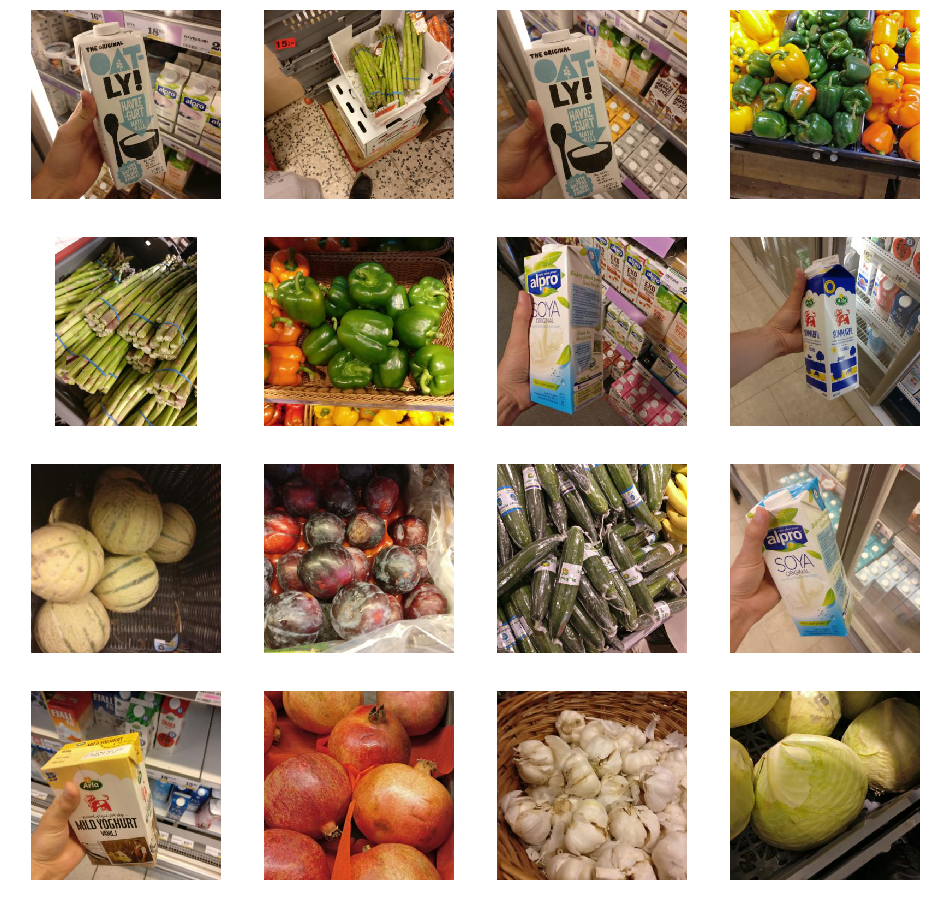

In [0]:
%matplotlib inline

import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Parameters for our graph; we'll output images in a 4x4 configuration
nrows = 4
ncols = 4

# Index for iterating over images
pic_index = 0
# Set up matplotlib fig, and size it to fit 4x4 pics
fig = plt.gcf()
fig.set_size_inches(ncols * 4, nrows * 4)
pic_index += 8
next_pix = images_train[pic_index-8:pic_index+8]
print(next_pix)
for i, img_path in enumerate(next_pix):
  # Set up subplot; subplot indices start at 1
  sp = plt.subplot(nrows, ncols, i + 1)
  sp.axis('Off') # Don't show axes (or gridlines)

  img = mpimg.imread(img_path)
  plt.imshow(img)
#   img.shape
plt.show()

In [0]:
for data_batch, labels_batch in train_generator:
    print('data batch shape:', data_batch.shape)
    print('labels batch shape:', labels_batch.shape)
    break

data batch shape: (24, 224, 224, 3)
labels batch shape: (24, 43)


###Visualisation and analysis of the data type, quality and class distributions.( /20%)

#Creation of multiple candidate network architectures

###The simple model is applied at first

In [0]:
from keras import layers
from keras import models

model = models.Sequential()
model.add(layers.Conv2D(32, (3, 3), activation='relu',
                        input_shape=(224, 224, 3)))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Flatten())
model.add(layers.Dense(32, activation='relu'))
model.add(layers.Dense(43, activation='softmax'))
#display the model so far
model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_125 (Conv2D)          (None, 222, 222, 32)      896       
_________________________________________________________________
max_pooling2d_36 (MaxPooling (None, 111, 111, 32)      0         
_________________________________________________________________
flatten_8 (Flatten)          (None, 394272)            0         
_________________________________________________________________
dense_50 (Dense)             (None, 32)                12616736  
_________________________________________________________________
dense_51 (Dense)             (None, 43)                1419      
Total params: 12,619,051
Trainable params: 12,619,051
Non-trainable params: 0
_________________________________________________________________


In [0]:
from keras import optimizers
model.compile(optimizer='rmsprop',
              loss='categorical_crossentropy',
              metrics=['accuracy'])

In [0]:
history = model.fit_generator(
      train_generator,
      steps_per_epoch=50,
      epochs=20,
      validation_data=validation_generator,
      validation_steps=10)

Epoch 1/20
50/50 [==============================] - 6s 118ms/step - loss: 15.7150 - acc: 0.0250 - val_loss: 15.8495 - val_acc: 0.0167
Epoch 2/20
50/50 [==============================] - 6s 111ms/step - loss: 15.7148 - acc: 0.0250 - val_loss: 15.6480 - val_acc: 0.0292
Epoch 3/20
50/50 [==============================] - 6s 111ms/step - loss: 15.7552 - acc: 0.0225 - val_loss: 15.4557 - val_acc: 0.0411
Epoch 4/20
50/50 [==============================] - 6s 112ms/step - loss: 15.7820 - acc: 0.0208 - val_loss: 15.7823 - val_acc: 0.0208
Epoch 5/20
50/50 [==============================] - 6s 112ms/step - loss: 15.7150 - acc: 0.0250 - val_loss: 15.8495 - val_acc: 0.0167
Epoch 6/20
50/50 [==============================] - 6s 110ms/step - loss: 15.7686 - acc: 0.0217 - val_loss: 15.8237 - val_acc: 0.0183
Epoch 7/20
50/50 [==============================] - 6s 111ms/step - loss: 15.7686 - acc: 0.0217 - val_loss: 15.5808 - val_acc: 0.0333
Epoch 8/20
50/50 [==============================] - 6s 112ms/s

In [0]:
model.save('GStore_1.h5')

The best performance in this simple model is not well.
The accuracy can only reach around 0.04, the validation accuracy is also quite low about 0.04 and it does not show incressing trend so more layers of convolution neural network are added in the following model.

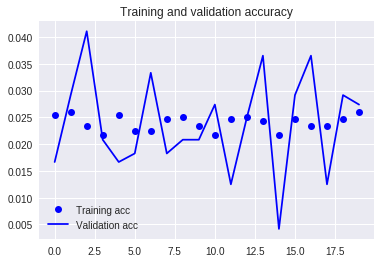

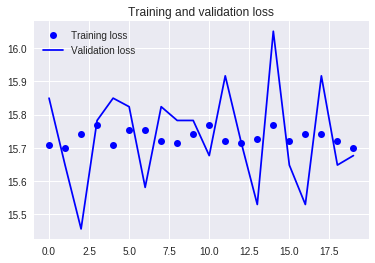

In [0]:
import matplotlib.pyplot as plt

acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

###Convolution neural network
The more comples CNN model is applied in this part, however the result does not improve much as expectation.

In [0]:
from keras import layers
from keras import models

model = models.Sequential()
model.add(layers.Conv2D(32, (3, 3), activation='relu',
                        input_shape=(224, 224, 3)))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(64, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(128, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(128, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(256, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(256, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Flatten())
model.add(layers.Dense(526, activation='relu'))
model.add(layers.Dense(43, activation='sigmoid'))
model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_164 (Conv2D)          (None, 222, 222, 32)      896       
_________________________________________________________________
max_pooling2d_73 (MaxPooling (None, 111, 111, 32)      0         
_________________________________________________________________
conv2d_165 (Conv2D)          (None, 109, 109, 64)      18496     
_________________________________________________________________
max_pooling2d_74 (MaxPooling (None, 54, 54, 64)        0         
_________________________________________________________________
conv2d_166 (Conv2D)          (None, 52, 52, 128)       73856     
_________________________________________________________________
max_pooling2d_75 (MaxPooling (None, 26, 26, 128)       0         
_________________________________________________________________
conv2d_167 (Conv2D)          (None, 24, 24, 128)       147584    
__________

In [0]:
# from keras import optimizers

model.compile(optimizer='rmsprop',
              loss='categorical_crossentropy',
              metrics=['accuracy'])

###Result without rescale

In [0]:
history = model.fit_generator(
      train_generator,
      steps_per_epoch=50,
      epochs=10,
      validation_data=validation_generator,
      validation_steps=10)
#100,50
# class_weight=class_weights

Epoch 1/10
50/50 [==============================] - 7s 133ms/step - loss: 9.1287 - acc: 0.0242 - val_loss: 9.1399 - val_acc: 0.0375
Epoch 2/10
50/50 [==============================] - 6s 124ms/step - loss: 9.1179 - acc: 0.0225 - val_loss: 8.3522 - val_acc: 0.0320
Epoch 3/10
50/50 [==============================] - 6s 127ms/step - loss: 9.2130 - acc: 0.0233 - val_loss: 9.4104 - val_acc: 0.0250
Epoch 4/10
50/50 [==============================] - 6s 123ms/step - loss: 9.4918 - acc: 0.0208 - val_loss: 9.8343 - val_acc: 0.0137
Epoch 5/10
50/50 [==============================] - 6s 125ms/step - loss: 9.0746 - acc: 0.0267 - val_loss: 9.3563 - val_acc: 0.0250
Epoch 6/10
50/50 [==============================] - 6s 124ms/step - loss: 8.8740 - acc: 0.0208 - val_loss: 9.2481 - val_acc: 0.0125
Epoch 7/10
50/50 [==============================] - 6s 125ms/step - loss: 9.0232 - acc: 0.0233 - val_loss: 8.9451 - val_acc: 0.0320
Epoch 8/10
50/50 [==============================] - 6s 125ms/step - loss: 9.

In [0]:
model.save('GStore_2.h5')

Especially we can not see much improvement in the process, so the numbers of epochs are added to see more about the training trend.

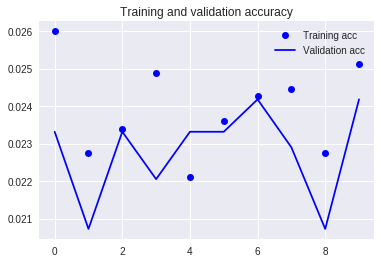

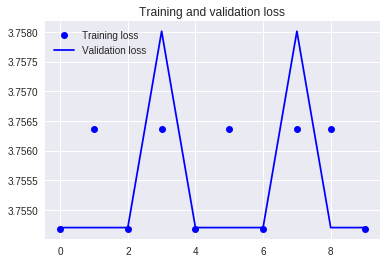

In [0]:
import matplotlib.pyplot as plt

acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

We would also like to see which type of data can get better performance in the training process.
(with rescale/ without rescale)/(add class weight/without add class weight)

###Result with rescale (slightly better)

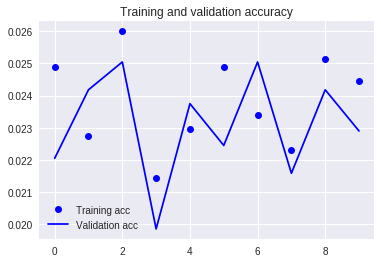

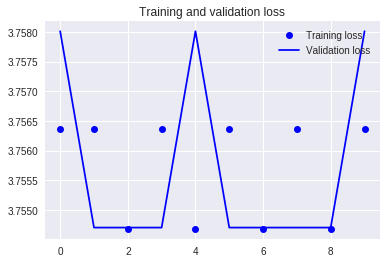

In [0]:
import matplotlib.pyplot as plt

acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

###Result of switch the class weight (slightly better)

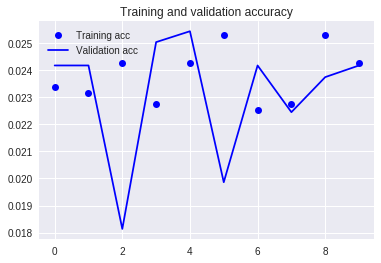

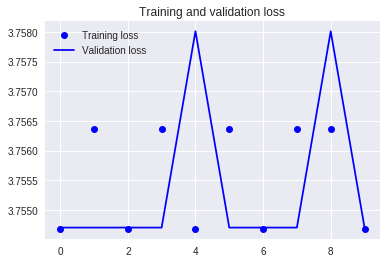

In [0]:
import matplotlib.pyplot as plt

acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

###Result of more epochs are set=30 (slightly better)

In [0]:
history = model.fit_generator(
      train_generator,
      steps_per_epoch=100,
      epochs=30,
      validation_data=validation_generator,
      validation_steps=50,
      class_weight=class_weights)

Epoch 1/30
100/100 [==============================] - 15s 151ms/step - loss: 3.6122 - acc: 0.0238 - val_loss: 3.7547 - val_acc: 0.0190
Epoch 2/30
100/100 [==============================] - 15s 150ms/step - loss: 3.6494 - acc: 0.0225 - val_loss: 3.7547 - val_acc: 0.0250
Epoch 3/30
100/100 [==============================] - 15s 150ms/step - loss: 3.6122 - acc: 0.0233 - val_loss: 3.7547 - val_acc: 0.0233
Epoch 4/30
100/100 [==============================] - 15s 150ms/step - loss: 3.6494 - acc: 0.0242 - val_loss: 3.7580 - val_acc: 0.0237
Epoch 5/30
100/100 [==============================] - 15s 149ms/step - loss: 3.6494 - acc: 0.0217 - val_loss: 3.7547 - val_acc: 0.0216
Epoch 6/30
100/100 [==============================] - 15s 149ms/step - loss: 3.6122 - acc: 0.0225 - val_loss: 3.7547 - val_acc: 0.0268
Epoch 7/30
100/100 [==============================] - 15s 148ms/step - loss: 3.6494 - acc: 0.0233 - val_loss: 3.7547 - val_acc: 0.0216
Epoch 8/30
100/100 [==============================] - 1

In [0]:
model.save('GStore_3.h5')

Nervertheless, these changes did not improve much on the performance of model, the accuracy of this model even worse than the simple layer one.

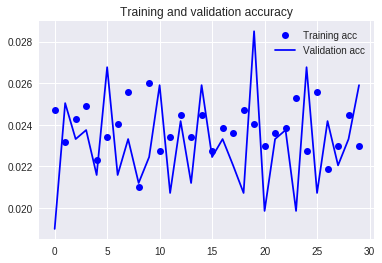

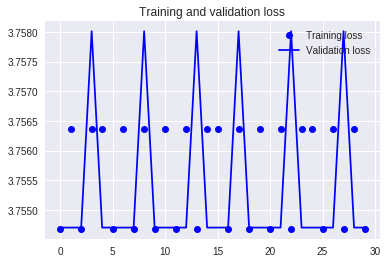

In [0]:
import matplotlib.pyplot as plt

acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

Although there are more layers are added, the performance still worse and also quite easy to get overfitting situation.
The reason might be the dataset is too small so in the next step the data argumantation is provided.

###Creation of multiple candidate network architectures( /15%)

#Training

###Data argumentation


*   Generate more data through flipping the images. 
*   Set 'early stopping'
*   Apply Dropout




####Randomly transform the images.

In [0]:
datagen = ImageDataGenerator(
      rotation_range=40,
      width_shift_range=0.2,
      height_shift_range=0.2,
      shear_range=0.2,
      zoom_range=0.2,
      horizontal_flip=True,
      fill_mode='nearest')

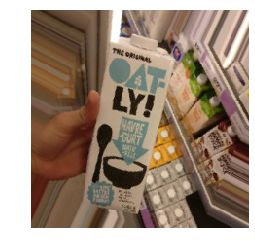

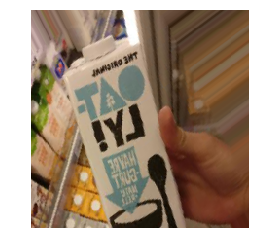

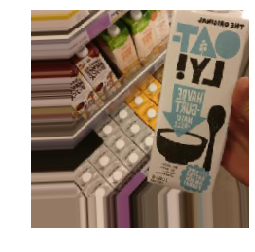

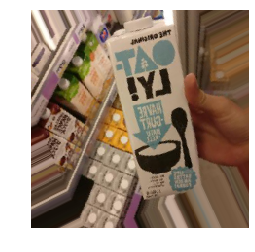

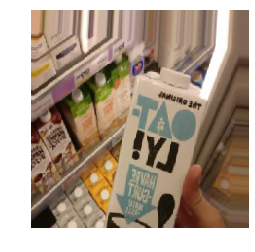

In [0]:
import numpy as np
# This is module with image preprocessing utilities
from keras.preprocessing import image

# fnames
# We pick one image to "augment"
img_path = images_train[2]
# img_path
# Read the image and resize it
img = image.load_img(img_path, target_size=(224, 224))
# img
# Convert it to a Numpy array with shape (224, 224, 3)
x = image.img_to_array(img)
# np.shape(x)
x = x.reshape((1,) + x.shape)
# x.shape
# The .flow() command below generates batches of randomly transformed images.
# It will loop indefinitely, so we need to `break` the loop at some point!
i = 0
for batch in datagen.flow(x, batch_size=1):
    plt.figure(i)
    imgplot = plt.imshow(image.array_to_img(batch[0]))
    plt.axis('off')
    i += 1
    if i % 5 == 0:
        break

plt.show()


####Apply dropout

In [0]:
model = models.Sequential()
model.add(layers.Conv2D(32, (3, 3), activation='relu',
                        input_shape=(224, 224, 3)))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(64, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(128, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(128, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(256, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(256, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Flatten())
model.add(layers.Dropout(0.5))
model.add(layers.Dense(512, activation='relu'))
model.add(layers.Dense(43, activation='sigmoid'))

# model.compile(loss='binary_crossentropy',
#               optimizer=optimizers.RMSprop(lr=1e-4),
#               metrics=['acc'])
model.summary()
model.compile(optimizer='rmsprop',
              loss='categorical_crossentropy',
              metrics=['accuracy'])

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_170 (Conv2D)          (None, 222, 222, 32)      896       
_________________________________________________________________
max_pooling2d_79 (MaxPooling (None, 111, 111, 32)      0         
_________________________________________________________________
conv2d_171 (Conv2D)          (None, 109, 109, 64)      18496     
_________________________________________________________________
max_pooling2d_80 (MaxPooling (None, 54, 54, 64)        0         
_________________________________________________________________
conv2d_172 (Conv2D)          (None, 52, 52, 128)       73856     
_________________________________________________________________
max_pooling2d_81 (MaxPooling (None, 26, 26, 128)       0         
_________________________________________________________________
conv2d_173 (Conv2D)          (None, 24, 24, 128)       147584    
__________

In [0]:
model.save('GStore_4.h5')

####Early stop is set

In [0]:
from keras.layers import Input, Reshape, Dense, AveragePooling2D, UpSampling2D, Conv2D, Flatten, PReLU, Lambda, Conv1D
from keras.models import Model
from keras.initializers import RandomUniform
from keras.engine.topology import Layer
from keras.optimizers import SGD
from keras.callbacks import *
from keras import *
train_dir = train_folder
validation_dir = test_folder
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,)

# Note that the validation data should not be augmented!
test_datagen = ImageDataGenerator()

train_generator = train_datagen.flow_from_directory(
        # This is the target directory
        train_dir,
        target_size=(224, 224), 
        batch_size=24,
        class_mode='categorical')

validation_generator = test_datagen.flow_from_directory(
        validation_dir,
        target_size=(224, 224), 
        batch_size=24,
        class_mode='categorical')
early_stop = EarlyStopping(monitor='loss', min_delta=0.0001, patience=10)
history = model.fit_generator(
      train_generator,
      steps_per_epoch=100,
      epochs=100,
      validation_data=validation_generator,
      validation_steps=50,
      callbacks = [early_stop],
      shuffle = True,)

Found 673 images belonging to 43 classes.
Found 651 images belonging to 43 classes.
Epoch 1/100
100/100 [==============================] - 48s 482ms/step - loss: 3.6171 - acc: 0.0350 - val_loss: 12.2583 - val_acc: 0.0483
Epoch 2/100
100/100 [==============================] - 37s 368ms/step - loss: 3.3047 - acc: 0.0620 - val_loss: 11.3523 - val_acc: 0.0596
Epoch 3/100
100/100 [==============================] - 37s 368ms/step - loss: 3.1731 - acc: 0.0609 - val_loss: 10.3953 - val_acc: 0.0803
Epoch 4/100
100/100 [==============================] - 37s 371ms/step - loss: 2.9482 - acc: 0.1067 - val_loss: 7.4147 - val_acc: 0.0665
Epoch 5/100
100/100 [==============================] - 38s 378ms/step - loss: 2.7878 - acc: 0.1367 - val_loss: 6.7760 - val_acc: 0.0729
Epoch 6/100
100/100 [==============================] - 38s 379ms/step - loss: 2.5598 - acc: 0.2187 - val_loss: 5.7130 - val_acc: 0.0820
Epoch 7/100
100/100 [==============================] - 37s 372ms/step - loss: 2.3439 - acc: 0.267

After the data augumentation the performance has improved, the accuracy reach around 0.3, however the validation accuracy is still low which is about 0.08.
And through the training trend, we can see the accuracy does not improve and the loss does not dcrease in the training process. As the solution, the other two classificaiton methods are provided. 

In [0]:
model.save('GStore_5.h5')

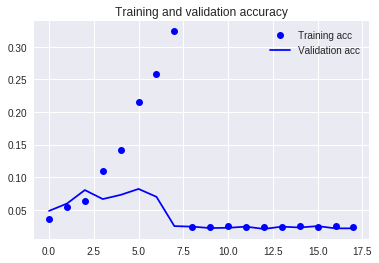

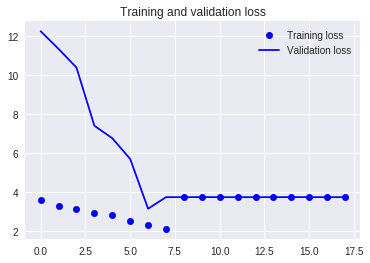

In [0]:
acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

###ResNet50

Data processing- the default image size of ResNet is 224*224.

In [0]:
image_size = 224
data_generator = ImageDataGenerator(preprocessing_function=preprocess_input)
# print(train_folder)
# print(train_folder)
train_generator      = data_generator.flow_from_directory(train_folder, target_size=(image_size, image_size), batch_size=24, class_mode='categorical')
validation_generator = data_generator.flow_from_directory(test_folder, target_size=(image_size, image_size), batch_size=24, class_mode='categorical')
for data_batch, labels_batch in train_generator:
    print('data batch shape:', data_batch.shape)
    print('labels batch shape:', labels_batch.shape)
    break

Found 673 images belonging to 43 classes.
Found 651 images belonging to 43 classes.
data batch shape: (24, 224, 224, 3)
labels batch shape: (24, 43)


In [0]:
from keras.applications.inception_v3 import InceptionV3
from keras.preprocessing import image
from keras.models import Model
from keras.layers import Dense, GlobalAveragePooling2D
from keras import backend as K
# create the base pre-trained model
#base_model = InceptionV3(weights='imagenet', include_top=False)
# model = models.Sequential()
base_model = ResNet50(weights='imagenet', include_top=False)

lamb = 0.001

# add a global spatial average pooling layer
x = base_model.output
x = GlobalAveragePooling2D()(x)

# and a logistic layer -- let's say we have 200 classes
predictions = Dense(43, activation='softmax')(x)

# this is the model we will train
model = Model(inputs=base_model.input, outputs=predictions)

# first: train only the top layers (which were randomly initialized)
# i.e. freeze all convolutional InceptionV3 layers

for layer in base_model.layers:
    layer.trainable = False

# compile the model (should be done *after* setting layers to non-trainable)
model.compile(optimizer='rmsprop', loss='categorical_crossentropy', metrics=['accuracy'] )


# train the model on the new data for a few epochs
history = model.fit_generator(train_generator,
                    steps_per_epoch=100,
                    epochs=10,
                    validation_data=validation_generator,
                    validation_steps=50)


Instructions for updating:
Colocations handled automatically by placer.


/usr/local/lib/python3.6/dist-packages/keras_applications/resnet50.py:265: UserWarning: The output shape of `ResNet50(include_top=False)` has been changed since Keras 2.2.0.
  warnings.warn('The output shape of `ResNet50(include_top=False)` '


94658560/94653016 [==============================] - 3s 0us/step
Instructions for updating:
Use tf.cast instead.
Epoch 1/10
100/100 [==============================] - 38s 378ms/step - loss: 1.2819 - acc: 0.7215 - val_loss: 1.0963 - val_acc: 0.6565
Epoch 2/10
100/100 [==============================] - 30s 302ms/step - loss: 0.2247 - acc: 0.9628 - val_loss: 0.8399 - val_acc: 0.7280
Epoch 3/10
100/100 [==============================] - 30s 300ms/step - loss: 0.1536 - acc: 0.9591 - val_loss: 0.7378 - val_acc: 0.7617
Epoch 4/10
100/100 [==============================] - 30s 301ms/step - loss: 0.1199 - acc: 0.9703 - val_loss: 0.7569 - val_acc: 0.7375
Epoch 5/10
100/100 [==============================] - 30s 302ms/step - loss: 0.1844 - acc: 0.9695 - val_loss: 0.8924 - val_acc: 0.7489
Epoch 6/10
100/100 [==============================] - 30s 301ms/step - loss: 0.1228 - acc: 0.9686 - val_loss: 0.7462 - val_acc: 0.7798
Epoch 7/10
100/100 [==============================] - 30s 299ms/step - loss: 

In [0]:
model.save('GStore_6.h5')

The training accuracy of ResNet50 can reach 97%, and the validation accuracy reach around 80%.
The performance of ResNet50 is much better than convolution neural network.

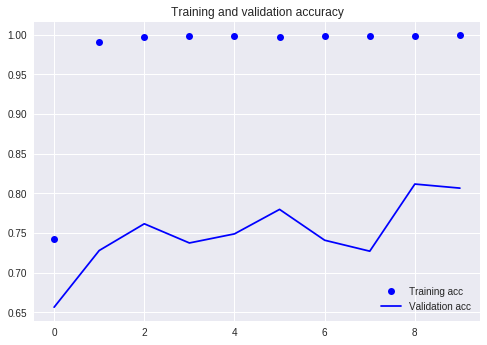

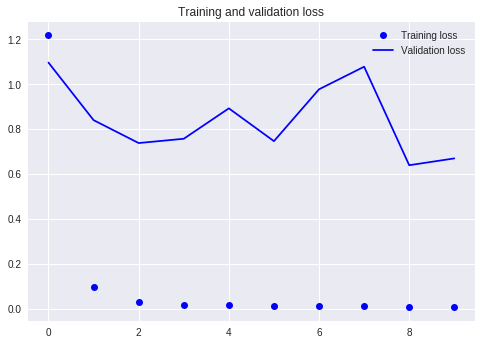

In [0]:
acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

In [0]:
model = load_model('GStore_6.h5')

Try to freeze top 150 layers and unfreeze the rest to retrain the model.

In [0]:
# at this point, the top layers are well trained and we can start fine-tuning
# convolutional layers from inception V3. We will freeze the bottom N layers
# and train the remaining top layers.

# let's visualize layer names and layer indices to see how many layers
# we should freeze:
for i, layer in enumerate(base_model.layers):
   print(i, layer.name)

# we chose to train the top 2 inception blocks, i.e. we will freeze
# the first 150 layers and unfreeze the rest:
for layer in model.layers[:150]:
   layer.trainable = False
for layer in model.layers[150:]:
   layer.trainable = True

# we need to recompile the model for these modifications to take effect
# we use SGD with a low learning rate
from keras.optimizers import SGD
model.compile(optimizer=SGD(lr=0.0001, momentum=0.9), loss='categorical_crossentropy', metrics=['accuracy'])

# we train our model again (this time fine-tuning the top 2 inception blocks
# alongside the top Dense layers
history = model.fit_generator(train_generator,
                    steps_per_epoch=100,
                    epochs=10,
                    validation_data=validation_generator,
                    validation_steps=50)

0 input_1
1 conv1_pad
2 conv1
3 bn_conv1
4 activation_1
5 pool1_pad
6 max_pooling2d_1
7 res2a_branch2a
8 bn2a_branch2a
9 activation_2
10 res2a_branch2b
11 bn2a_branch2b
12 activation_3
13 res2a_branch2c
14 res2a_branch1
15 bn2a_branch2c
16 bn2a_branch1
17 add_1
18 activation_4
19 res2b_branch2a
20 bn2b_branch2a
21 activation_5
22 res2b_branch2b
23 bn2b_branch2b
24 activation_6
25 res2b_branch2c
26 bn2b_branch2c
27 add_2
28 activation_7
29 res2c_branch2a
30 bn2c_branch2a
31 activation_8
32 res2c_branch2b
33 bn2c_branch2b
34 activation_9
35 res2c_branch2c
36 bn2c_branch2c
37 add_3
38 activation_10
39 res3a_branch2a
40 bn3a_branch2a
41 activation_11
42 res3a_branch2b
43 bn3a_branch2b
44 activation_12
45 res3a_branch2c
46 res3a_branch1
47 bn3a_branch2c
48 bn3a_branch1
49 add_4
50 activation_13
51 res3b_branch2a
52 bn3b_branch2a
53 activation_14
54 res3b_branch2b
55 bn3b_branch2b
56 activation_15
57 res3b_branch2c
58 bn3b_branch2c
59 add_5
60 activation_16
61 res3c_branch2a
62 bn3c_branch2a

It shows much better curve of evaluation, so we wanna apply this model again with higher epoch.

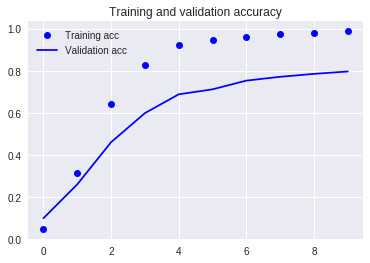

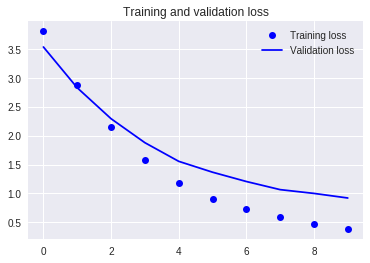

In [0]:
acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

In [0]:
model.save('GStore_6_1.h5')

In [0]:
model.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            (None, None, None, 3 0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, None, None, 3 0           input_3[0][0]                    
__________________________________________________________________________________________________
conv1 (Conv2D)                  (None, None, None, 6 9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
bn_conv1 (BatchNormalization)   (None, None, None, 6 256         conv1[0][0]                      
__________________________________________________________________________________________________
activation

While this step has higher epochs, the early stop function is also added.

In [0]:
from keras.layers import Input, Reshape, Dense, AveragePooling2D, UpSampling2D, Conv2D, Flatten, PReLU, Lambda, Conv1D
from keras.models import Model
from keras.initializers import RandomUniform
from keras.engine.topology import Layer
from keras.optimizers import SGD
from keras.callbacks import *
from keras import *
# for i, layer in enumerate(base_model.layers):
#    print(i, layer.name)

# we chose to train the top 2 inception blocks, i.e. we will freeze
# the first 150 layers and unfreeze the rest:
for layer in model.layers[:150]:
   layer.trainable = False
for layer in model.layers[150:]:
   layer.trainable = True

# we need to recompile the model for these modifications to take effect
# we use SGD with a low learning rate
from keras.optimizers import SGD
model.compile(optimizer=SGD(lr=0.0001, momentum=0.9), loss='categorical_crossentropy', metrics=['accuracy'])

# we train our model again (this time fine-tuning the top 2 inception blocks
# alongside the top Dense layers
early_stop = EarlyStopping(monitor='loss', min_delta=0.0001, patience=10)
history = model.fit_generator(train_generator,
                    steps_per_epoch=100,
                    epochs=50,
                    validation_data=validation_generator,
                    validation_steps=50,
                    callbacks = [early_stop],)

Epoch 1/50
100/100 [==============================] - 38s 384ms/step - loss: 0.0962 - acc: 0.9802 - val_loss: 0.2730 - val_acc: 0.9128
Epoch 2/50
100/100 [==============================] - 35s 350ms/step - loss: 0.0745 - acc: 0.9802 - val_loss: 0.2687 - val_acc: 0.9162
Epoch 3/50
100/100 [==============================] - 35s 350ms/step - loss: 0.1020 - acc: 0.9802 - val_loss: 0.2736 - val_acc: 0.9135
Epoch 4/50
100/100 [==============================] - 35s 351ms/step - loss: 0.1081 - acc: 0.9802 - val_loss: 0.2660 - val_acc: 0.9128
Epoch 5/50
100/100 [==============================] - 35s 349ms/step - loss: 0.1570 - acc: 0.9604 - val_loss: 0.2759 - val_acc: 0.9145
Epoch 6/50
100/100 [==============================] - 35s 350ms/step - loss: 0.1291 - acc: 0.9703 - val_loss: 0.2436 - val_acc: 0.9249
Epoch 7/50
100/100 [==============================] - 35s 351ms/step - loss: 0.0922 - acc: 0.9802 - val_loss: 0.2623 - val_acc: 0.9102
Epoch 8/50
100/100 [==============================] - 3

The performance improves, the acc reach 99% and the valadaion acc is around 90% so stop the training.

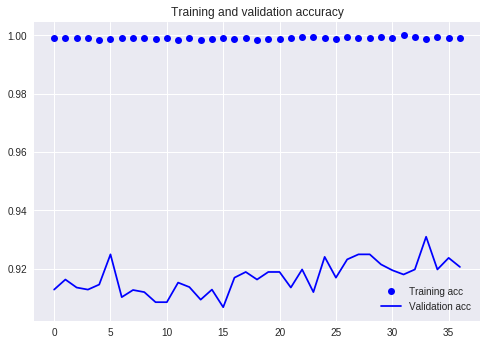

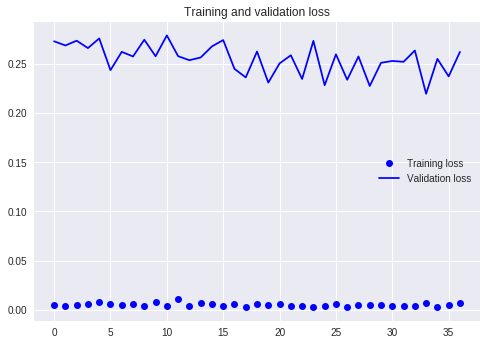

In [0]:
acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

In [0]:
model.save('GStore_6_2.h5')

###Inception

In [0]:
image_size = 299
data_generator = ImageDataGenerator(preprocessing_function=preprocess_input)
# print(train_folder)
# print(train_folder)
train_generator      = data_generator.flow_from_directory(train_folder, target_size=(image_size, image_size), batch_size=24, class_mode='categorical')
validation_generator = data_generator.flow_from_directory(test_folder, target_size=(image_size, image_size), batch_size=24, class_mode='categorical')

for data_batch, labels_batch in train_generator:
    print('data batch shape:', data_batch.shape)
    print('labels batch shape:', labels_batch.shape)
    break

Found 673 images belonging to 43 classes.
Found 651 images belonging to 43 classes.
data batch shape: (24, 299, 299, 3)
labels batch shape: (24, 43)


In [0]:
from keras.applications.inception_v3 import InceptionV3
from keras.preprocessing import image
from keras.models import Model
from keras.layers import Dense, GlobalAveragePooling2D
from keras import backend as K
# create the base pre-trained model
base_model = InceptionV3(weights='imagenet', include_top=False)
# model = models.Sequential()
# base_model = ResNet50(weights='imagenet', include_top=False)

lamb = 0.001

# add a global spatial average pooling layer
x = base_model.output
x = GlobalAveragePooling2D()(x)

# and a logistic layer -- let's say we have 200 classes
predictions = Dense(43, activation='softmax')(x)

# this is the model we will train
model = Model(inputs=base_model.input, outputs=predictions)

# first: train only the top layers (which were randomly initialized)
# i.e. freeze all convolutional InceptionV3 layers

for layer in base_model.layers:
    layer.trainable = False

# compile the model (should be done *after* setting layers to non-trainable)
model.compile(optimizer='rmsprop', loss='categorical_crossentropy', metrics=['accuracy'] )


# train the model on the new data for a few epochs
history = model.fit_generator(train_generator,
                    steps_per_epoch=100,
                    epochs=10,
                    validation_data=validation_generator,
                    validation_steps=50)


87916544/87910968 [==============================] - 8s 0us/step
Epoch 1/10
100/100 [==============================] - 45s 455ms/step - loss: 2.6317 - acc: 0.4097 - val_loss: 15.0514 - val_acc: 0.0102
Epoch 2/10
100/100 [==============================] - 36s 360ms/step - loss: 1.0561 - acc: 0.8432 - val_loss: 15.1051 - val_acc: 0.0155
Epoch 3/10
100/100 [==============================] - 36s 359ms/step - loss: 0.5767 - acc: 0.9191 - val_loss: 15.4753 - val_acc: 0.0216
Epoch 4/10
100/100 [==============================] - 36s 358ms/step - loss: 0.3342 - acc: 0.9453 - val_loss: 15.2613 - val_acc: 0.0147
Epoch 5/10
100/100 [==============================] - 36s 359ms/step - loss: 0.2931 - acc: 0.9516 - val_loss: 15.4691 - val_acc: 0.0170
Epoch 6/10
100/100 [==============================] - 36s 358ms/step - loss: 0.2191 - acc: 0.9674 - val_loss: 15.6444 - val_acc: 0.0112
Epoch 7/10
100/100 [==============================] - 36s 356ms/step - loss: 0.2409 - acc: 0.9562 - val_loss: 15.6711 -

The performance is not well so the freezing way is applied in the following.

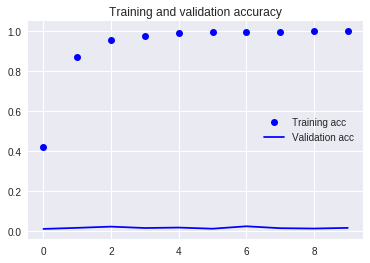

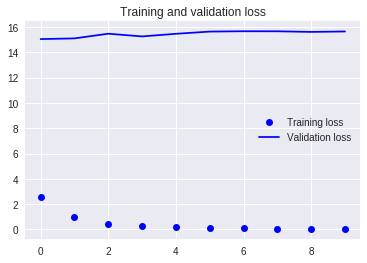

In [0]:
acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

In [0]:
model.save('GStore_7.h5')

In [0]:
model = load_model('GStore_7.h5')

In [0]:
model.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            (None, None, None, 3 0                                            
__________________________________________________________________________________________________
conv2d_31 (Conv2D)              (None, None, None, 3 864         input_2[0][0]                    
__________________________________________________________________________________________________
batch_normalization_1 (BatchNor (None, None, None, 3 96          conv2d_31[0][0]                  
__________________________________________________________________________________________________
activation_60 (Activation)      (None, None, None, 3 0           batch_normalization_1[0][0]      
__________________________________________________________________________________________________
conv2d_32 

In [0]:
# at this point, the top layers are well trained and we can start fine-tuning
# convolutional layers from inception V3. We will freeze the bottom N layers
# and train the remaining top layers.

# let's visualize layer names and layer indices to see how many layers
# we should freeze:
for i, layer in enumerate(base_model.layers):
   print(i, layer.name)

# we chose to train the top 2 inception blocks, i.e. we will freeze
# the first 249 layers and unfreeze the rest:
for layer in model.layers[:150]:
   layer.trainable = False
for layer in model.layers[150:]:
   layer.trainable = True

# we need to recompile the model for these modifications to take effect
# we use SGD with a low learning rate
from keras.optimizers import SGD
model.compile(optimizer=SGD(lr=0.0001, momentum=0.9), loss='categorical_crossentropy', metrics=['accuracy'])

# we train our model again (this time fine-tuning the top 2 inception blocks
# alongside the top Dense layers
history = model.fit_generator(train_generator,
                    steps_per_epoch=100,
                    epochs=10,
                    validation_data=validation_generator,
                    validation_steps=50)

0 input_3
1 conv1_pad
2 conv1
3 bn_conv1
4 activation_154
5 pool1_pad
6 max_pooling2d_85
7 res2a_branch2a
8 bn2a_branch2a
9 activation_155
10 res2a_branch2b
11 bn2a_branch2b
12 activation_156
13 res2a_branch2c
14 res2a_branch1
15 bn2a_branch2c
16 bn2a_branch1
17 add_17
18 activation_157
19 res2b_branch2a
20 bn2b_branch2a
21 activation_158
22 res2b_branch2b
23 bn2b_branch2b
24 activation_159
25 res2b_branch2c
26 bn2b_branch2c
27 add_18
28 activation_160
29 res2c_branch2a
30 bn2c_branch2a
31 activation_161
32 res2c_branch2b
33 bn2c_branch2b
34 activation_162
35 res2c_branch2c
36 bn2c_branch2c
37 add_19
38 activation_163
39 res3a_branch2a
40 bn3a_branch2a
41 activation_164
42 res3a_branch2b
43 bn3a_branch2b
44 activation_165
45 res3a_branch2c
46 res3a_branch1
47 bn3a_branch2c
48 bn3a_branch1
49 add_20
50 activation_166
51 res3b_branch2a
52 bn3b_branch2a
53 activation_167
54 res3b_branch2b
55 bn3b_branch2b
56 activation_168
57 res3b_branch2c
58 bn3b_branch2c
59 add_21
60 activation_169
61 

There is not much improment shown in Inception model.

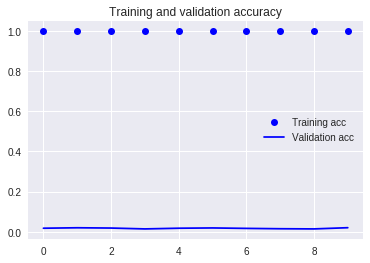

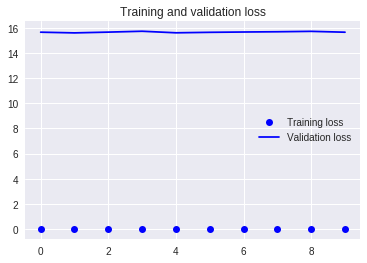

In [0]:
acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

###Training (/15%)

#Empirical evaluation of performance, and potentially visualisation and analysis of the trained network

In [0]:
!ls

###Visulize the trained work

There are three models displayed in this part, convolution neural network, ResNet50 and inception.

###Convolution neural network

In [0]:
from keras.models import load_model

model = load_model('GStore_4.h5') 
model.summary()  # As a reminder.

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_170 (Conv2D)          (None, 222, 222, 32)      896       
_________________________________________________________________
max_pooling2d_79 (MaxPooling (None, 111, 111, 32)      0         
_________________________________________________________________
conv2d_171 (Conv2D)          (None, 109, 109, 64)      18496     
_________________________________________________________________
max_pooling2d_80 (MaxPooling (None, 54, 54, 64)        0         
_________________________________________________________________
conv2d_172 (Conv2D)          (None, 52, 52, 128)       73856     
_________________________________________________________________
max_pooling2d_81 (MaxPooling (None, 26, 26, 128)       0         
_________________________________________________________________
conv2d_173 (Conv2D)          (None, 24, 24, 128)       147584    
__________

The original image is shown.

(1, 224, 224, 3)


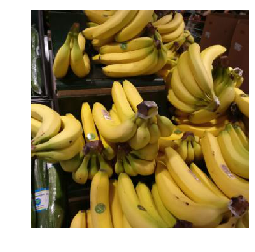

In [0]:
import matplotlib.pyplot as plt

img_path = images_train[17]

# We preprocess the image into a 4D tensor
from keras.preprocessing import image
import numpy as np

img = image.load_img(img_path, target_size=(224, 224))
img_tensor = image.img_to_array(img)
img_tensor = np.expand_dims(img_tensor, axis=0)
# Remember that the model was trained on inputs
# that were preprocessed in the following way:
img_tensor /= 255.

# Its shape is (1, 224, 224, 3)
print(img_tensor.shape)
# img_tensor[0].shape
plt.imshow(img_tensor[0])
plt.axis('off')
plt.show()

Generate previous 8 layers of output and create the new model.

In [0]:
from keras import models

# Extracts the outputs of the top 8 layers:
layer_outputs = [layer.output for layer in model.layers[:8]]
# Creates a model that will return these outputs, given the model input:
activation_model = models.Model(inputs=model.input, outputs=layer_outputs)

In [0]:
# This will return a list of 5 Numpy arrays:
# one array per layer activation
activations = activation_model.predict(img_tensor)

In [0]:
first_layer_activation = activations[0]
print(first_layer_activation.shape)

(1, 222, 222, 32)


Show the result of first 6 layers.

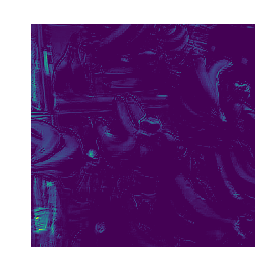

In [0]:
plt.matshow(first_layer_activation[0, :, :,5], cmap='viridis')
plt.axis('off')
plt.show()

Show the result of first 30 layers.

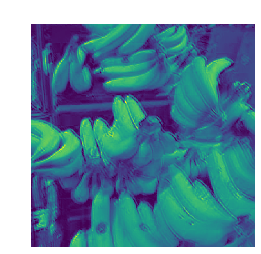

In [0]:
plt.matshow(first_layer_activation[0, :, :, 29], cmap='viridis')
plt.axis('off')
plt.show()


Visulise the result of each layer.

Through this process, we can see the features of image are focused and zoomed in by convolution and maxpooling step. The dropout step which some outputs are set as 0 shown as black blocks can also be seen in each layer.

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


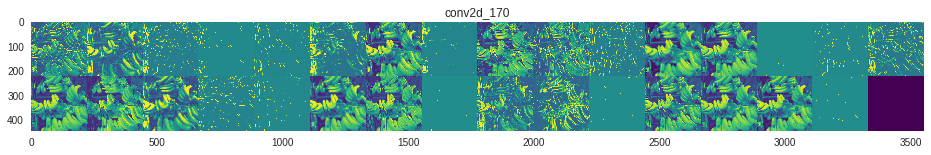

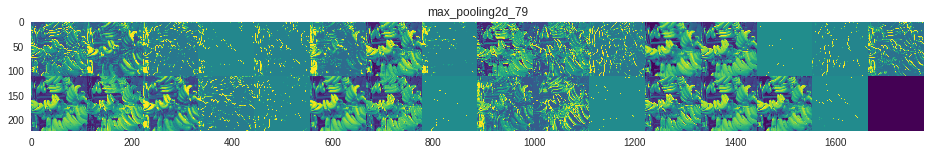

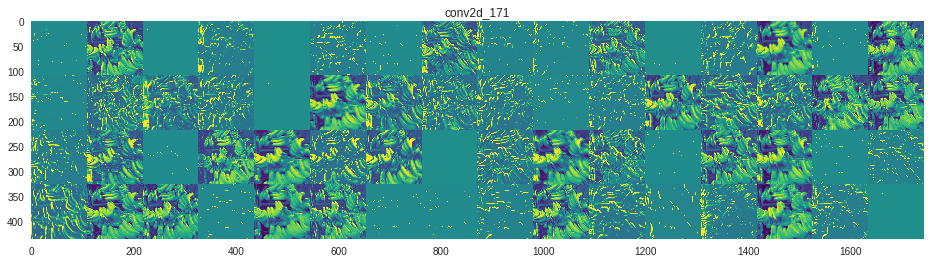

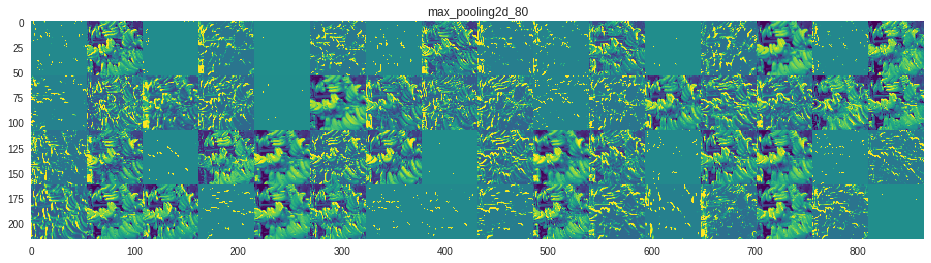

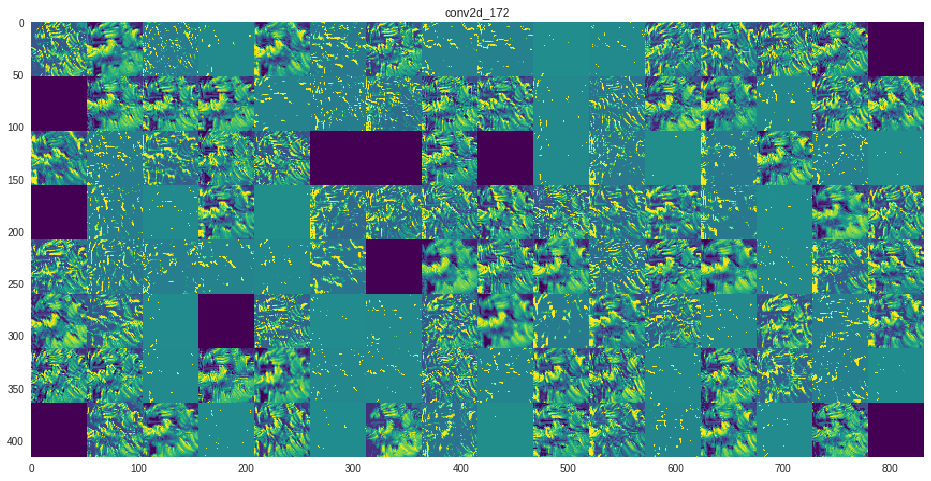

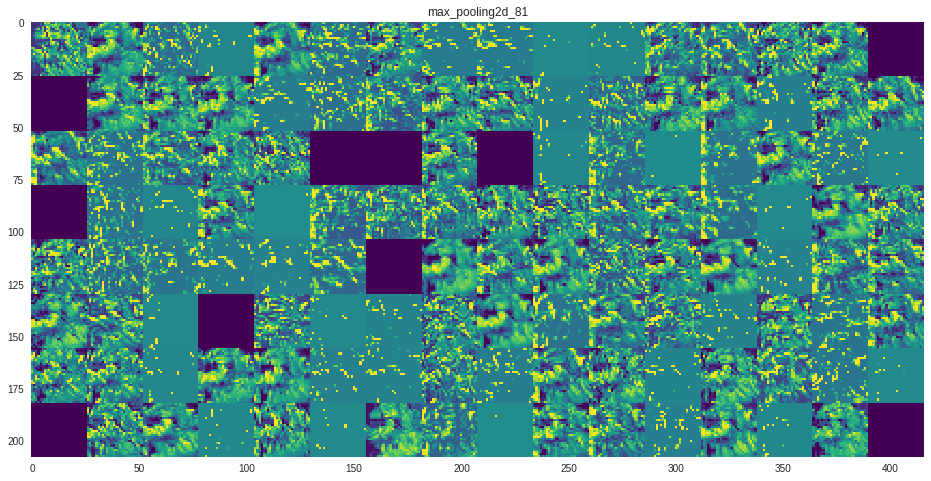

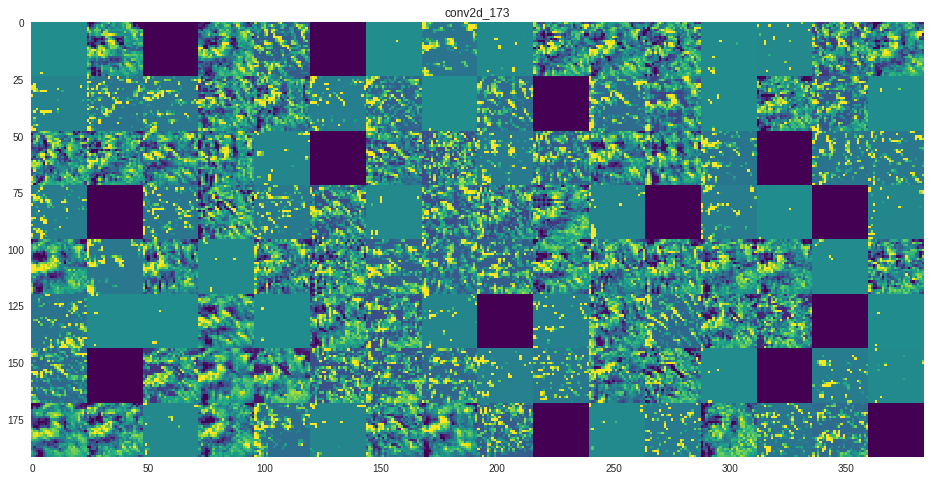

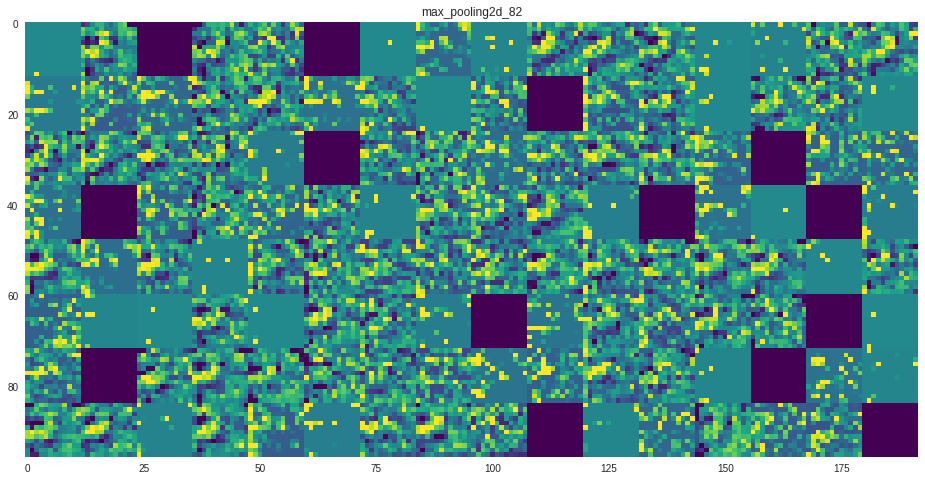

In [0]:
import keras

# These are the names of the layers, so can have them as part of our plot
layer_names = []
for layer in model.layers[:8]:
    layer_names.append(layer.name)

images_per_row = 16
# activations
# layer_names
# Now let's display our feature maps
for layer_name, layer_activation in zip(layer_names, activations):
    # This is the number of features in the feature map
    n_features = layer_activation.shape[-1]

    # The feature map has shape (1, size, size, n_features)
    size = layer_activation.shape[1]

    # We will tile the activation channels in this matrix
    n_cols = n_features // images_per_row #16
    display_grid = np.zeros((size * n_cols, images_per_row * size))

    # We'll tile each filter into this big horizontal grid
    for col in range(n_cols):
        for row in range(images_per_row):
            channel_image = layer_activation[0,
                                             :, :,
                                             col * images_per_row + row]
#             print(col * images_per_row + row)
#             print(channel_image)
            # Post-process the feature to make it visually palatable
            channel_image -= channel_image.mean()
            channel_image /= channel_image.std()
            channel_image *= 64
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')
            display_grid[col * size : (col + 1) * size,
                         row * size : (row + 1) * size] = channel_image

    # Display the grid
    scale = 1. / size
    plt.figure(figsize=(scale * display_grid.shape[1],
                        scale * display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.imshow(display_grid, aspect='auto', cmap='viridis')
    
plt.show()

###ResNet50

In [0]:
from keras.models import load_model

model = load_model('GStore_6_2.h5') 
model.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            (None, None, None, 3 0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, None, None, 3 0           input_3[0][0]                    
__________________________________________________________________________________________________
conv1 (Conv2D)                  (None, None, None, 6 9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
bn_conv1 (BatchNormalization)   (None, None, None, 6 256         conv1[0][0]                      
__________________________________________________________________________________________________
activation

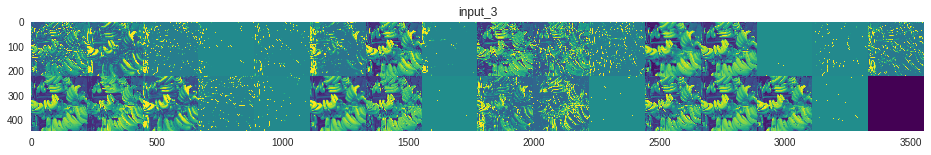

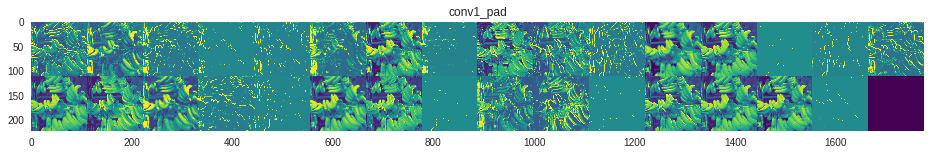

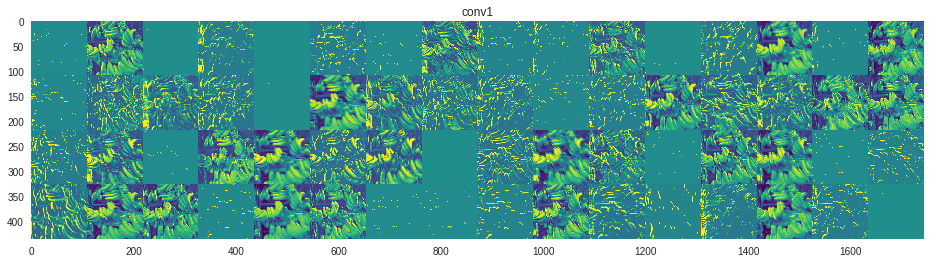

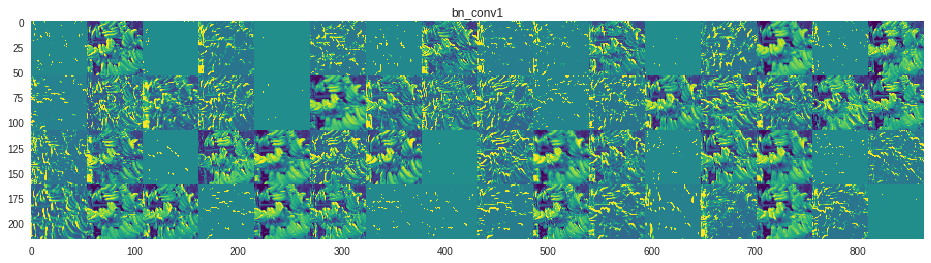

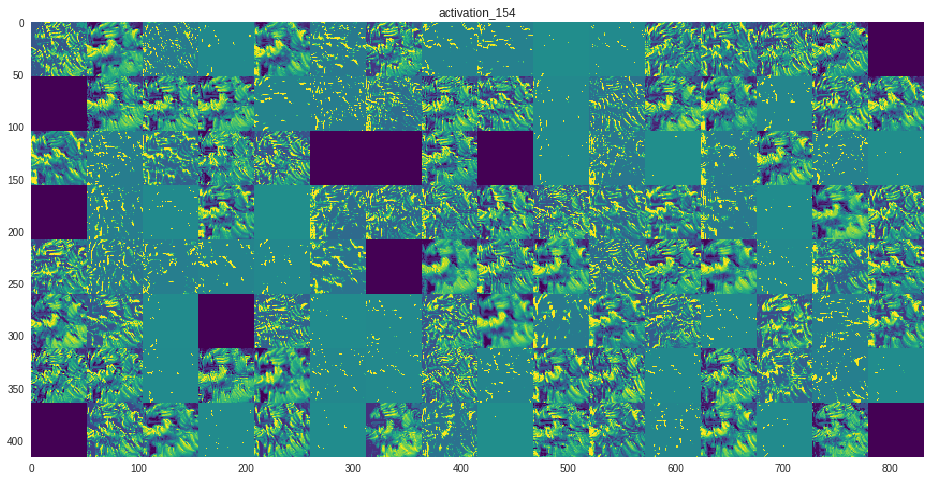

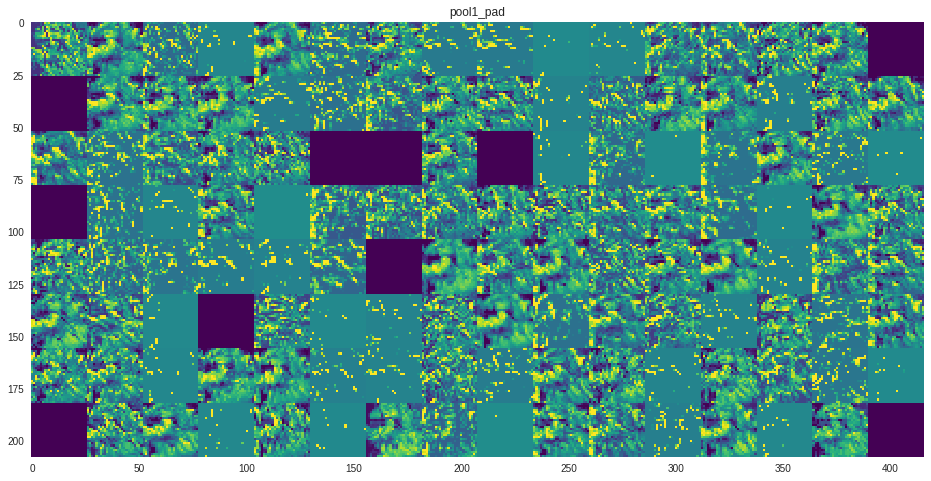

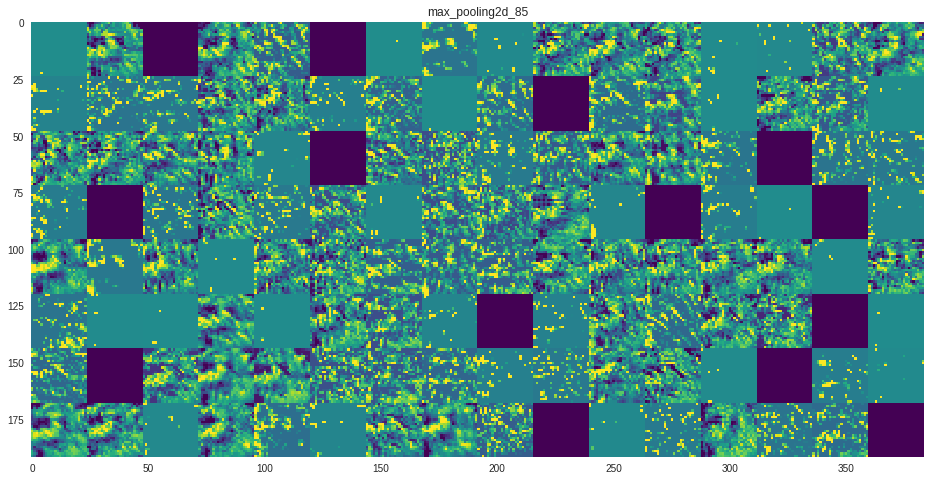

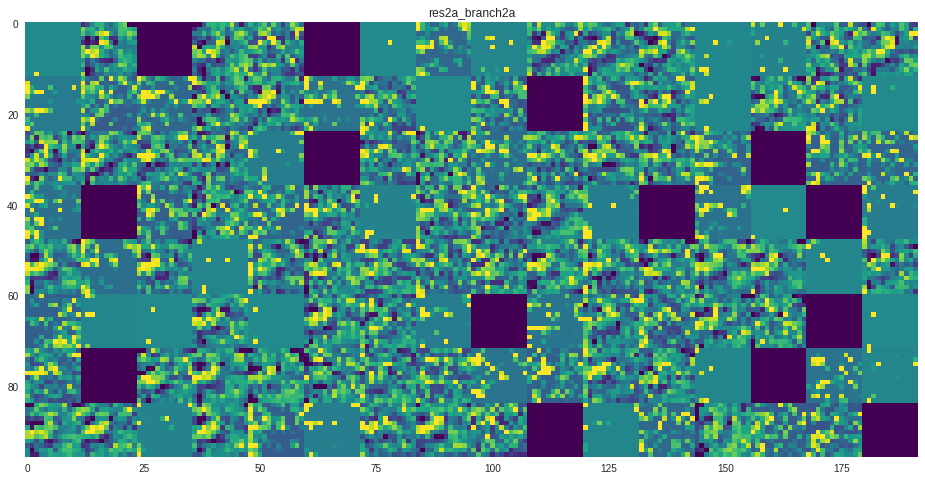

In [0]:
import keras

# These are the names of the layers, so can have them as part of our plot
layer_names = []
for layer in model.layers[:8]:
    layer_names.append(layer.name)

images_per_row = 16
# activations
# layer_names
# Now let's display our feature maps
for layer_name, layer_activation in zip(layer_names, activations):
    # This is the number of features in the feature map
    n_features = layer_activation.shape[-1]

    # The feature map has shape (1, size, size, n_features)
    size = layer_activation.shape[1]

    # We will tile the activation channels in this matrix
    n_cols = n_features // images_per_row #16
    display_grid = np.zeros((size * n_cols, images_per_row * size))

    # We'll tile each filter into this big horizontal grid
    for col in range(n_cols):
        for row in range(images_per_row):
            channel_image = layer_activation[0,
                                             :, :,
                                             col * images_per_row + row]
#             print(col * images_per_row + row)
#             print(channel_image)
            # Post-process the feature to make it visually palatable
            channel_image -= channel_image.mean()
            channel_image /= channel_image.std()
            channel_image *= 64
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')
            display_grid[col * size : (col + 1) * size,
                         row * size : (row + 1) * size] = channel_image

    # Display the grid
    scale = 1. / size
    plt.figure(figsize=(scale * display_grid.shape[1],
                        scale * display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.imshow(display_grid, aspect='auto', cmap='viridis')
    
plt.show()

In [0]:
from keras.models import load_model

model = load_model('GStore_7.h5') 
model.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            (None, None, None, 3 0                                            
__________________________________________________________________________________________________
conv2d_31 (Conv2D)              (None, None, None, 3 864         input_2[0][0]                    
__________________________________________________________________________________________________
batch_normalization_1 (BatchNor (None, None, None, 3 96          conv2d_31[0][0]                  
__________________________________________________________________________________________________
activation_60 (Activation)      (None, None, None, 3 0           batch_normalization_1[0][0]      
__________________________________________________________________________________________________
conv2d_32 

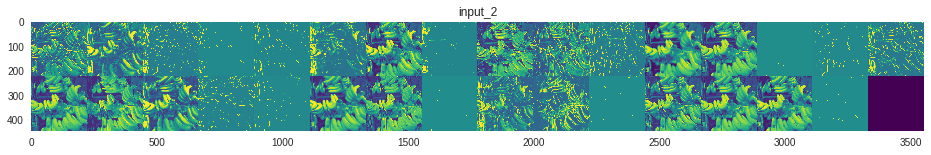

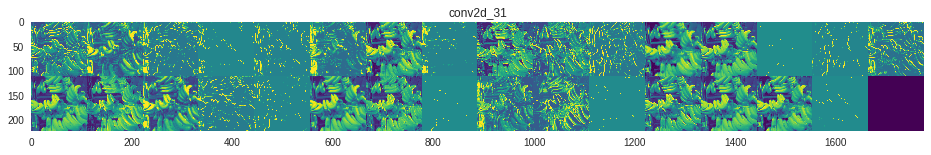

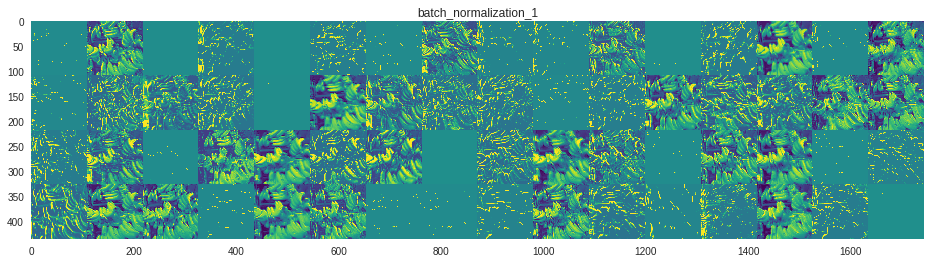

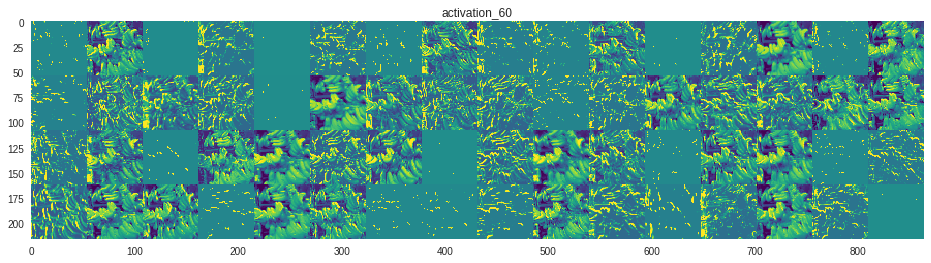

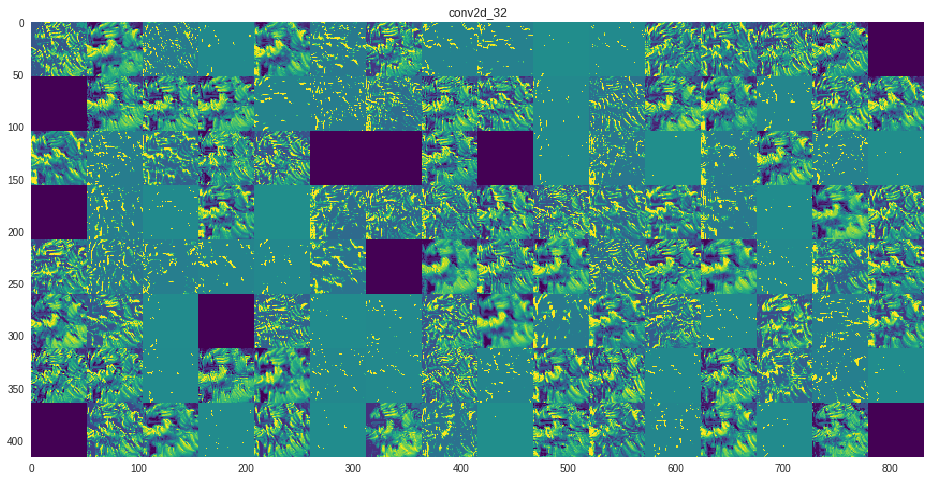

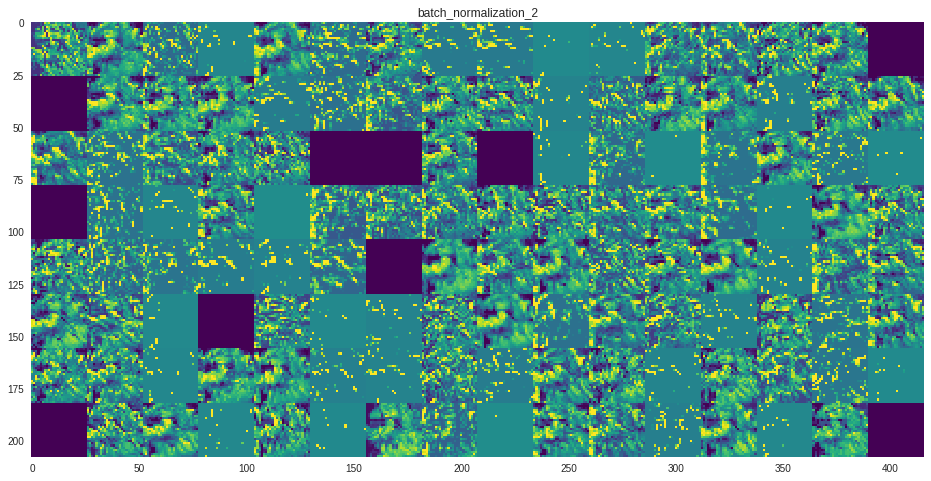

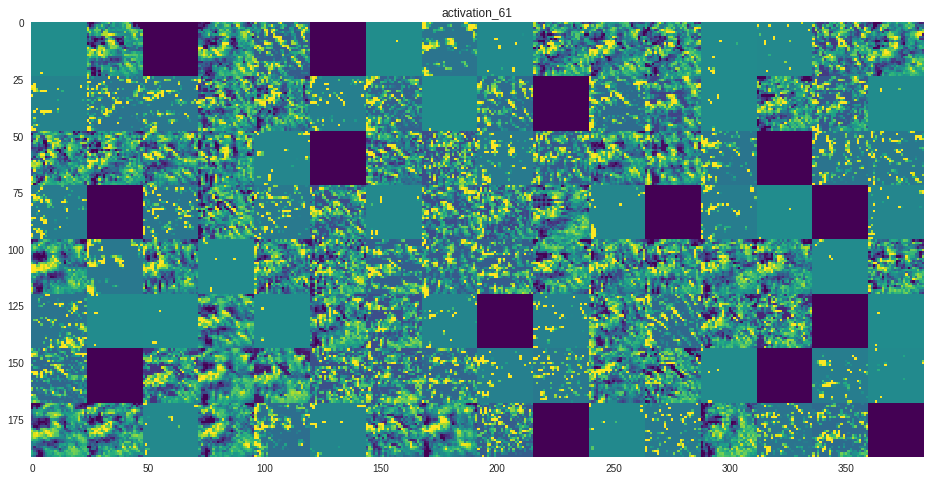

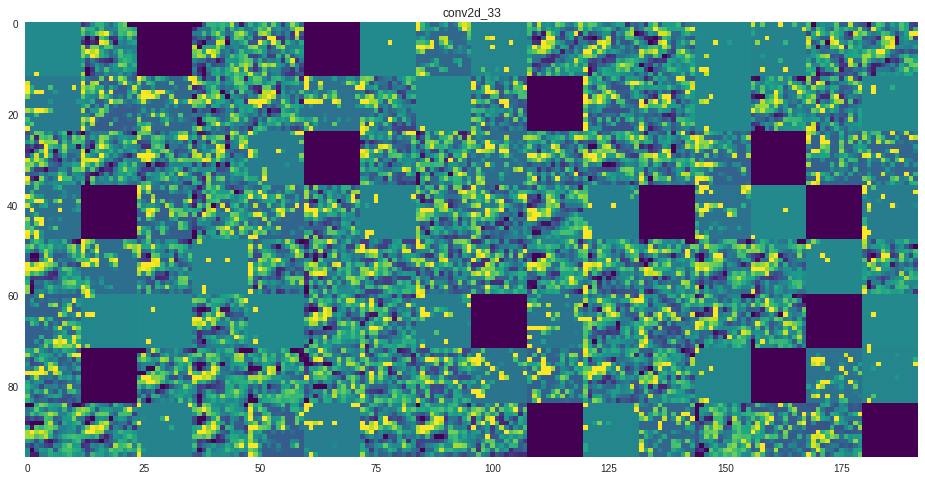

In [0]:
import keras

# These are the names of the layers, so can have them as part of our plot
layer_names = []
for layer in model.layers[:8]:
    layer_names.append(layer.name)

images_per_row = 16
# activations
# layer_names
# Now let's display our feature maps
for layer_name, layer_activation in zip(layer_names, activations):
    # This is the number of features in the feature map
    n_features = layer_activation.shape[-1]

    # The feature map has shape (1, size, size, n_features)
    size = layer_activation.shape[1]

    # We will tile the activation channels in this matrix
    n_cols = n_features // images_per_row #16
    display_grid = np.zeros((size * n_cols, images_per_row * size))

    # We'll tile each filter into this big horizontal grid
    for col in range(n_cols):
        for row in range(images_per_row):
            channel_image = layer_activation[0,
                                             :, :,
                                             col * images_per_row + row]
#             print(col * images_per_row + row)
#             print(channel_image)
            # Post-process the feature to make it visually palatable
            channel_image -= channel_image.mean()
            channel_image /= channel_image.std()
            channel_image *= 64
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')
            display_grid[col * size : (col + 1) * size,
                         row * size : (row + 1) * size] = channel_image

    # Display the grid
    scale = 1. / size
    plt.figure(figsize=(scale * display_grid.shape[1],
                        scale * display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.imshow(display_grid, aspect='auto', cmap='viridis')
    
plt.show()

###Empirical evaluation of performance, and potentially visualisation and analysis of the trained network (/20%)

#Report on the performance, discussing the suitability of the final network for use

As the result, the ResNet 50 model has the best performance compared to convolution neural network and Inception.
Its accuracy reach 99% and the valadation accuracy is around 90%.

So this model can be applied for prediction as below.

In [0]:
from keras.models import load_model
model = load_model('GStore_6_2.h5') 
model.summary()

In [0]:
from keras.preprocessing import image
from keras.applications.vgg16 import preprocess_input, decode_predictions
import numpy as np

img_path = images[0]

img = image.load_img(img_path, target_size=(224, 224))

# `x` is a float32 Numpy array of shape (224, 224, 3)
x = image.img_to_array(img)

# We add a dimension to transform our array into a "batch"
# of size (1, 224, 224, 3)
x = np.expand_dims(x, axis=0)

# Finally we preprocess the batch
# (this does channel-wise color normalization)
x = preprocess_input(x)

preds = model.predict(x)
print(preds)

# print(np.argmax(preds[0]))

[[8.6634429e-03 3.9739796e-05 1.2833560e-04 1.1455200e-04 3.5703811e-04
  8.7765256e-05 6.4767170e-04 7.3370384e-06 8.9557230e-05 3.4474448e-05
  3.2931912e-05 1.8762112e-04 4.9786316e-04 1.0313009e-04 3.2109473e-04
  1.5930719e-03 9.6717536e-01 9.0599169e-05 8.0783699e-05 3.3102923e-03
  4.9515827e-05 1.8919629e-05 1.2154372e-04 2.8559074e-03 3.3084585e-03
  2.0714153e-03 1.0271790e-03 1.3103369e-03 1.6362344e-04 2.5464161e-04
  9.0494075e-05 2.7315094e-04 1.2999123e-04 1.7288391e-04 2.2394287e-03
  2.5519470e-04 1.1131641e-04 1.1508911e-04 1.7559172e-04 1.3375624e-04
  1.3687466e-04 2.3338527e-05 1.3986041e-03]]


In [0]:
test_loss, test_acc = model.evaluate(x, preds)
test_acc

1/1 [==============================] - 0s 49ms/step


1.0

###Report on the performance, discussing the suitability of the final network for use( /15%)